In [74]:
import kagglehub

# Download latest version
path = kagglehub.dataset_download("sobhanmoosavi/us-accidents")

print("Path to dataset files:", path)

Path to dataset files: /root/.cache/kagglehub/datasets/sobhanmoosavi/us-accidents/versions/13


In [75]:
from pyspark.sql import SparkSession
from pyspark.sql.functions import col
from pyspark.rdd import RDD
import matplotlib.pyplot as plt
import pandas as pd
import os

In [76]:
spark = SparkSession.builder.appName("COMP4651Project").config("spark.driver.memory", "16g").getOrCreate()

# Read the CSV file from S3
df = spark.read.csv("/root/.cache/kagglehub/datasets/sobhanmoosavi/us-accidents/versions/13", header=True, inferSchema=True)


In [77]:
spark

In [78]:
df.printSchema()

root
 |-- ID: string (nullable = true)
 |-- Source: string (nullable = true)
 |-- Severity: integer (nullable = true)
 |-- Start_Time: timestamp (nullable = true)
 |-- End_Time: timestamp (nullable = true)
 |-- Start_Lat: double (nullable = true)
 |-- Start_Lng: double (nullable = true)
 |-- End_Lat: double (nullable = true)
 |-- End_Lng: double (nullable = true)
 |-- Distance(mi): double (nullable = true)
 |-- Description: string (nullable = true)
 |-- Street: string (nullable = true)
 |-- City: string (nullable = true)
 |-- County: string (nullable = true)
 |-- State: string (nullable = true)
 |-- Zipcode: string (nullable = true)
 |-- Country: string (nullable = true)
 |-- Timezone: string (nullable = true)
 |-- Airport_Code: string (nullable = true)
 |-- Weather_Timestamp: timestamp (nullable = true)
 |-- Temperature(F): double (nullable = true)
 |-- Wind_Chill(F): double (nullable = true)
 |-- Humidity(%): double (nullable = true)
 |-- Pressure(in): double (nullable = true)
 |-- V

# show NA values


In [79]:
df.na.drop(how="any", thresh=2).count()

7728394

In [80]:
rdd = df.rdd

In [81]:
df.head(1)

[Row(ID='A-1', Source='Source2', Severity=3, Start_Time=datetime.datetime(2016, 2, 8, 5, 46), End_Time=datetime.datetime(2016, 2, 8, 11, 0), Start_Lat=39.865147, Start_Lng=-84.058723, End_Lat=None, End_Lng=None, Distance(mi)=0.01, Description='Right lane blocked due to accident on I-70 Eastbound at Exit 41 OH-235 State Route 4.', Street='I-70 E', City='Dayton', County='Montgomery', State='OH', Zipcode='45424', Country='US', Timezone='US/Eastern', Airport_Code='KFFO', Weather_Timestamp=datetime.datetime(2016, 2, 8, 5, 58), Temperature(F)=36.9, Wind_Chill(F)=None, Humidity(%)=91.0, Pressure(in)=29.68, Visibility(mi)=10.0, Wind_Direction='Calm', Wind_Speed(mph)=None, Precipitation(in)=0.02, Weather_Condition='Light Rain', Amenity=False, Bump=False, Crossing=False, Give_Way=False, Junction=False, No_Exit=False, Railway=False, Roundabout=False, Station=False, Stop=False, Traffic_Calming=False, Traffic_Signal=False, Turning_Loop=False, Sunrise_Sunset='Night', Civil_Twilight='Night', Nautical

In [82]:
first_element = rdd.take(1)
first_element[0].ID

'A-1'

# Total cases

In [83]:
from pyspark.sql.functions import count

total_cases = df.count()
print("Total number of cases:", total_cases)

Total number of cases: 7728394


# Count by Cities

In [84]:
mapped_rdd = rdd.map(lambda x: (x.City, 1))

In [85]:
reduced_rdd = mapped_rdd.reduceByKey(lambda a, b: a + b)

In [86]:
# reduced_rdd.take(1)

[('Strongsville', 313)]

In [87]:
result_df = reduced_rdd.toDF(["City", "Cases"])

In [88]:
print(result_df)

DataFrame[City: string, Cases: bigint]


In [89]:
result_desc_df = result_df.orderBy(col("Cases").desc()).limit(15)
result_desc_df = result_desc_df.toPandas()

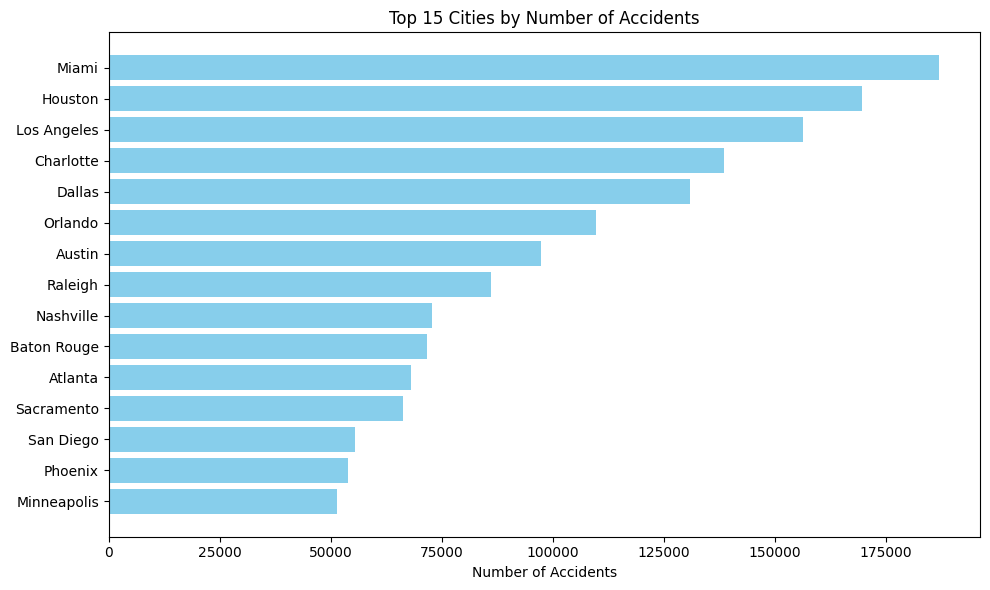

In [90]:
# Plotting
plt.figure(figsize=(10, 6))
plt.barh(result_desc_df["City"], result_desc_df["Cases"], color="skyblue")
plt.xlabel("Number of Accidents")
plt.title("Top 15 Cities by Number of Accidents")
plt.gca().invert_yaxis()  # Invert y-axis to have the city with the most accidents on top
plt.tight_layout()

# Show the plot
plt.show()


In [91]:
result_asec_df = result_df.orderBy(col("Cases")).limit(15)
result_asec_df = result_asec_df.toPandas()

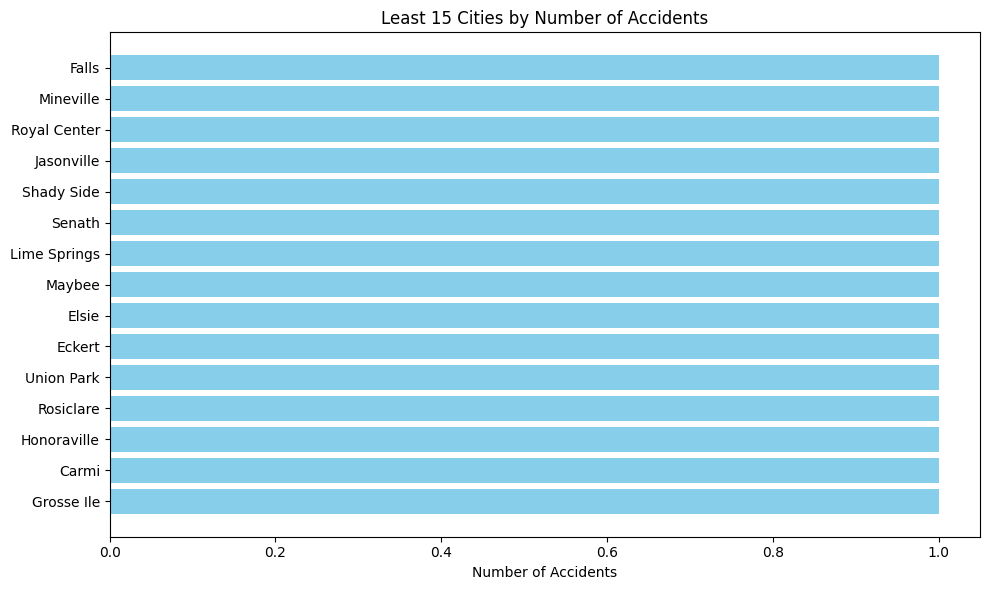

In [92]:
# Plotting
plt.figure(figsize=(10, 6))
plt.barh(result_asec_df["City"], result_asec_df["Cases"], color="skyblue")
plt.xlabel("Number of Accidents")
plt.title("Least 15 Cities by Number of Accidents")
plt.gca().invert_yaxis()  # Invert y-axis to have the city with the most accidents on top
plt.tight_layout()

# Show the plot
plt.show()


# Count By States

In [93]:
mapped_state_rdd = rdd.map(lambda x: (x.State, 1))

In [94]:
reduced_rdd = mapped_state_rdd.reduceByKey(lambda a, b: a + b)

In [95]:
reduced_rdd.take(1)

[('VA', 303301)]

In [96]:
result_df = reduced_rdd.toDF(["State", "Cases"])

In [97]:
result_desc_df = result_df.orderBy(col("Cases").desc()).limit(15)
result_desc_df = result_desc_df.toPandas()

In [98]:
result_asec_df = result_df.orderBy(col("Cases")).limit(15)
result_asec_df = result_asec_df.toPandas()

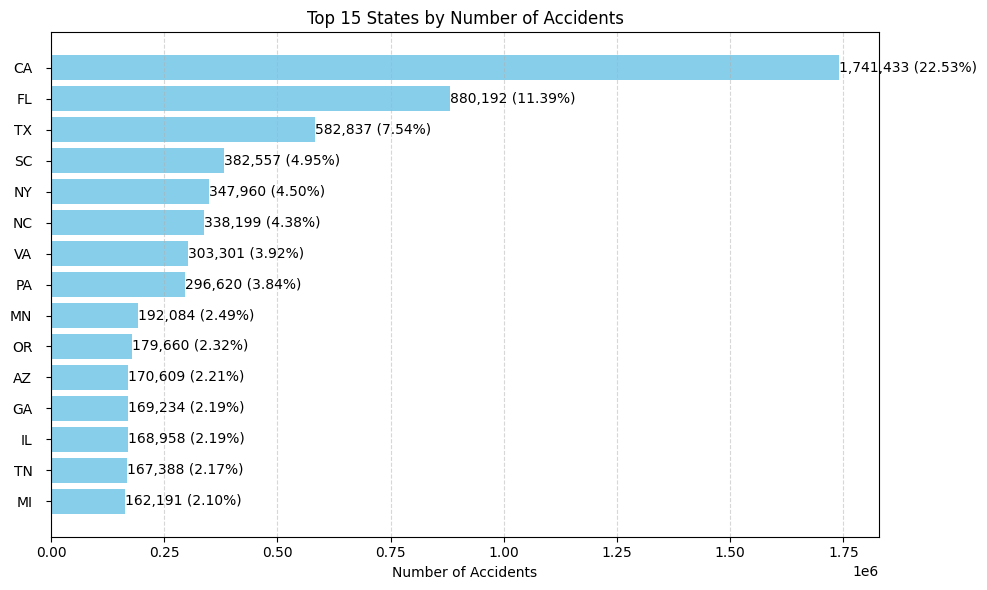

In [99]:
# Calculate the total number of accidents
total_accidents = 7728394

# Plotting
plt.figure(figsize=(10, 6))
plt.barh(result_desc_df["State"], result_desc_df["Cases"], color="#87CEEB")
plt.xlabel("Number of Accidents")
plt.title("Top 15 States by Number of Accidents")
plt.gca().invert_yaxis()

# Add some grid lines
plt.grid(axis="x", linestyle="--", alpha=0.5)

# Add some padding to the y-axis labels
plt.gca().tick_params(axis="y", pad=10)

# Show the values next to each bar
for i, (value, state) in enumerate(zip(result_desc_df["Cases"], result_desc_df["State"])):
    percentage = (value / total_accidents) * 100
    plt.text(value, i, f"{value:,} ({percentage:.2f}%)", va="center", ha="left")

# Show the plot
plt.tight_layout()
plt.show()

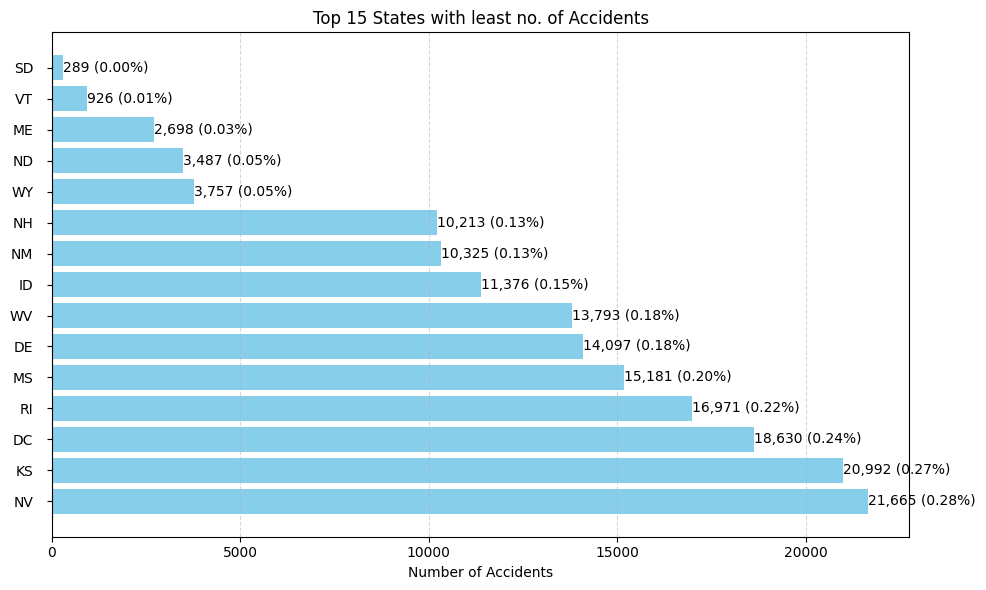

In [100]:
# Calculate the total number of accidents
total_accidents = 7728394

# Plotting
plt.figure(figsize=(10, 6))
plt.barh(result_asec_df["State"], result_asec_df["Cases"], color="#87CEEB")
plt.xlabel("Number of Accidents")
plt.title("Top 15 States with least no. of Accidents")
plt.gca().invert_yaxis()

# Add some grid lines
plt.grid(axis="x", linestyle="--", alpha=0.5)

# Add some padding to the y-axis labels
plt.gca().tick_params(axis="y", pad=10)

# Show the values next to each bar
for i, (value, state) in enumerate(zip(result_asec_df["Cases"], result_asec_df["State"])):
    percentage = (value / total_accidents) * 100
    plt.text(value, i, f"{value:,} ({percentage:.2f}%)", va="center", ha="left")

# Show the plot
plt.tight_layout()
plt.show()

## visualize by State

In [122]:
import folium
from folium.plugins import HeatMap
import pandas as pd

# Step 1: Prepare your data
# Assuming df is your original DataFrame with 'Start_Lat', 'Start_Lng', and 'State'
# Filter or sample the data if necessary
df_sampled = df.select("Start_Lat", "Start_Lng", "State").toPandas().dropna()

# Optionally, sample the data for better performance if the dataset is very large
df_sampled = df_sampled.sample(n=400000, random_state=4651)

# Step 2: Create a base map
# Center the map on the mean latitude and longitude of the dataset
center_lat = df_sampled["Start_Lat"].mean()
center_lng = df_sampled["Start_Lng"].mean()
m = folium.Map(location=[center_lat, center_lng], zoom_start=5)

# Step 3: Prepare data for the heatmap
# Convert latitude and longitude into a list of coordinate pairs
heat_data = df_sampled[["Start_Lat", "Start_Lng"]].values.tolist()

# Step 4: Add the heatmap layer
HeatMap(heat_data, radius=10, blur=15, max_zoom=1).add_to(m)

# Step 5: Display and save the map
m.save("accidents_heatmap.html")
m

# Timezone Analysis

In [105]:
rdd = df.rdd
mapped_rdd = rdd.map(lambda x: (x.Timezone, 1))
# Use combineByKey for optimized aggregation

combined_rdd = mapped_rdd.combineByKey(
    lambda value: value,  # CreateCombiner: Initialize the count for a key
    lambda acc, value: acc + value,  # MergeValue: Add one to the existing count
    lambda acc1, acc2: acc1 + acc2  # MergeCombiners: Combine counts from different partitions
)

result_df = combined_rdd.toDF(["TimeZone", "Cases"]).toPandas()



In [106]:
# import seaborn as sns
# # Plot using seaborn
# plt.figure(figsize=(10, 6))
# sns.barplot(x="Timezone", y="Cases", data=result_df, palette="viridis")

# # Add labels and title
# plt.xlabel("Timezone", fontsize=12)
# plt.ylabel("Number of Accidents", fontsize=12)
# plt.title("Number of Accidents by Timezone", fontsize=14)
# plt.xticks(rotation=45, ha="right")  # Rotate x-axis labels for better readability

# # Show the plot
# plt.tight_layout()  # Adjust layout to prevent clipping of labels
# plt.show()

ValueError: Could not interpret value `Timezone` for `x`. An entry with this name does not appear in `data`.

<Figure size 1000x600 with 0 Axes>

# Severity analysis

In [ ]:
rdd = df.rdd
mapped_rdd = rdd.map(lambda x: (x.Severity, 1))
# Use combineByKey for optimized aggregation

combined_rdd = mapped_rdd.combineByKey(
    lambda value: value,  # CreateCombiner: Initialize the count for a key
    lambda acc, value: acc + value,  # MergeValue: Add one to the existing count
    lambda acc1, acc2: acc1 + acc2  # MergeCombiners: Combine counts from different partitions
)
result_df = combined_rdd.toDF(["Severity", "Cases"]).toPandas()



In [ ]:
result_df

In [ ]:
plt.figure(figsize=(8, 8))  # Set figure size
plt.pie(
    result_df["Cases"],
    labels=result_df["Severity"],
    autopct="%1.1f%%",
    startangle=90,
    colors=["#ff9999", "#66b3ff", "#99ff99", "#ffcc99"]
)
plt.title("Distribution of Accident Severity")
plt.axis("equal")  # Equal aspect ratio ensures the pie is drawn as a circle
plt.show()  # Display the pie chart

# Accident Duration Analysis


In [ ]:
accident_duration_df = df.select("Start_Time", "End_Time", "Severity").dropna().withColumn("Duration", (df.End_Time - df.Start_Time)).toPandas()
accident_duration_df["Duration_Seconds"] = accident_duration_df[
    "Duration"
].dt.total_seconds()

In [ ]:
accident_duration_df.head(5)

In [ ]:
# plot a histogram of the duration of the accidents
import pandas as pd
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
plt.hist(accident_duration_df["Duration_Seconds"], bins=30, edgecolor="k", alpha=0.7)
plt.title("Histogram of Accident Duration")
plt.xlabel("Duration")
plt.ylabel("Frequency")
plt.grid(True)
plt.show()

# Year Analysis

In [ ]:
from pyspark.sql.functions import year

df_by_year = df.groupBy(year("Start_Time")).count().toPandas()
df_by_year = df_by_year.sort_values(by="year(Start_Time)").reset_index(drop=True)

In [ ]:
df_by_year

In [ ]:
# please plot df_by_year as a line chart, The x-axis is the year, the y-axis is the number of accidents
plt.figure(figsize=(10, 6))
plt.plot(df_by_year["year(Start_Time)"], df_by_year["count"], marker="o")
plt.title("Number of Accidents by Year")
plt.xlabel("Year")
plt.ylabel("Number of Accidents")
plt.grid(True)
plt.show()

# Group by year and visualize by coordinate


In [121]:
df_sampled = (
    df.selectExpr("year(Start_Time) as Year", "Start_Lat", "Start_Lng")
    .sample(withReplacement=False, fraction=600000 / df.count())  # Sample approximately 50,000 rows
    .toPandas()
    .dropna()  # Remove rows with missing data
)

# Step 2: Filter data for each year and create heatmaps
years = df_sampled["Year"].unique()  # Get the unique years
heatmaps = {}  # Dictionary to store heatmaps for each year

for year in sorted(years):
    # Filter data for the specific year
    df_filtered = df_sampled[df_sampled["Year"] == year]

    # Skip years with no data
    if df_filtered.empty:
        continue

    # Create a base map centered on the dataset
    center_lat = df_filtered["Start_Lat"].mean()
    center_lng = df_filtered["Start_Lng"].mean()
    m = folium.Map(location=[center_lat, center_lng], zoom_start=5)

    # Prepare heatmap data for the year
    heat_data = df_filtered[["Start_Lat", "Start_Lng"]].values.tolist()

    # Add heatmap layer
    HeatMap(heat_data, radius=10, blur=15, max_zoom=1).add_to(m)

    # Save the map to the dictionary for later access
    heatmaps[year] = m

    # Save the map as an HTML file for viewing
    m.save(f"accidents_heatmap_{year}.html")

# Year Analysis based on Severity

In [110]:
from pyspark.sql.functions import year

# Select the required columns
df_selected = df.select("Severity", "Start_Time")

# Extract year from Start_Time and group by Severity and year
df_grouped = df_selected.groupBy("Severity", year("Start_Time").alias("Year")).count()

# Convert to Pandas for inspection (optional)
df_grouped_pandas = df_grouped.toPandas()
df_grouped_pandas

,Severity,Year,count
0,1,2016,225
1,1,2017,282
2,3,2017,231169
3,2,2016,270026
4,4,2016,14355
5,3,2016,126215
6,2,2017,462474
7,4,2017,24168
8,2,2022,1603346
9,3,2022,77957


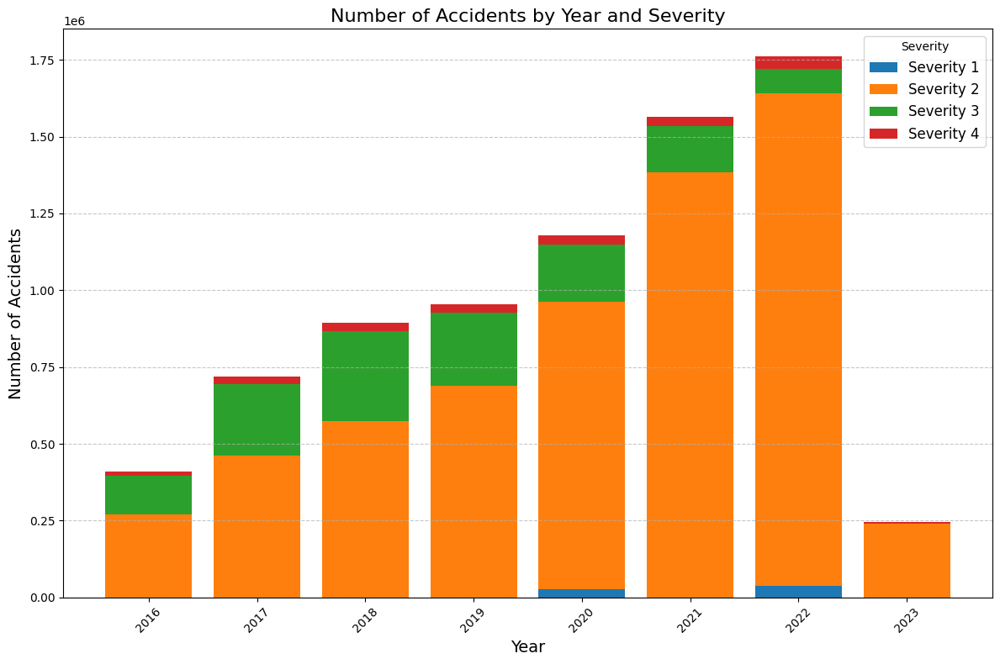

In [111]:
import pandas as pd
import matplotlib.pyplot as plt

# Assuming df_grouped_pandas is the grouped data in Pandas DataFrame format
# Pivot the data to make years the index, severity classes the columns, and counts the values
pivot_data = df_grouped_pandas.pivot(
    index="Year", columns="Severity", values="count"
).fillna(0)

# Sort the years for better visualization
pivot_data = pivot_data.sort_index()

# Plot the stacked bar chart
plt.figure(figsize=(12, 8))
severity_classes = pivot_data.columns  # Get the severity classes
bottom = None  # Used for stacking bars

# Plot each severity class as a segment of the stacked bar
for severity in severity_classes:
    if bottom is None:
        bar = plt.bar(
            pivot_data.index, pivot_data[severity], label=f"Severity {severity}"
        )
        bottom = pivot_data[severity]
    else:
        bar = plt.bar(
            pivot_data.index,
            pivot_data[severity],
            bottom=bottom,
            label=f"Severity {severity}",
        )
        bottom += pivot_data[severity]

# Add labels, title, and legend
plt.title("Number of Accidents by Year and Severity", fontsize=16)
plt.xlabel("Year", fontsize=14)
plt.ylabel("Number of Accidents", fontsize=14)
plt.xticks(pivot_data.index, rotation=45)
plt.legend(title="Severity", fontsize=12)
plt.grid(axis="y", linestyle="--", alpha=0.7)

# Show the plot
plt.tight_layout()
plt.show()

# Month Analysis

In [112]:
from pyspark.sql.functions import month

df_by_month = df.groupBy(month("Start_Time")).count().toPandas()
df_by_month = df_by_month.sort_values(by="month(Start_Time)").reset_index(drop=True)

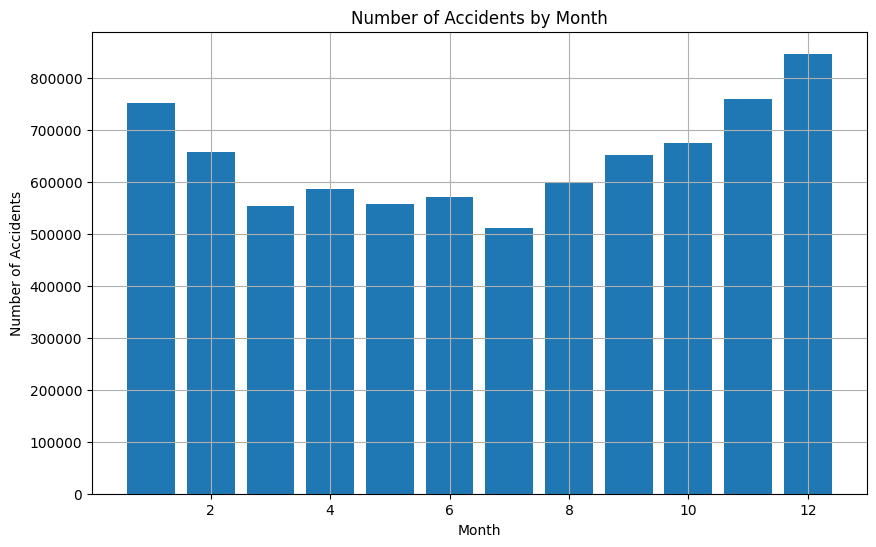

In [113]:
# show a bar chart of the number of accidents by month
plt.figure(figsize=(10, 6))
plt.bar(df_by_month["month(Start_Time)"], df_by_month["count"])
plt.title("Number of Accidents by Month")
plt.xlabel("Month")
plt.ylabel("Number of Accidents")
plt.grid(True)
plt.show()

## Group by month + Severity

In [114]:
# Step 1: Extract relevant columns and convert to RDD
rdd = df.select("Start_Time", "Severity").rdd.map(
    lambda row: (row["Start_Time"].month, row["Severity"])
)  # Extract month and severity

In [115]:
# Step 2: Map to key-value pairs and count occurrences
rdd_grouped = rdd.map(
    lambda x: ((x[0], x[1]), 1)
).reduceByKey(  # Key: (Month, Severity), Value: 1
    lambda a, b: a + b
)  # Aggregate counts

In [116]:
# Step 3: Convert to a more structured format for plotting
data = rdd_grouped.map(lambda x: (x[0][0], x[0][1], x[1])).collect()
df_grouped = pd.DataFrame(data, columns=["Month", "Severity", "Count"])

In [117]:
df_grouped = df_grouped.sort_values(by="Month").reset_index(drop=True)

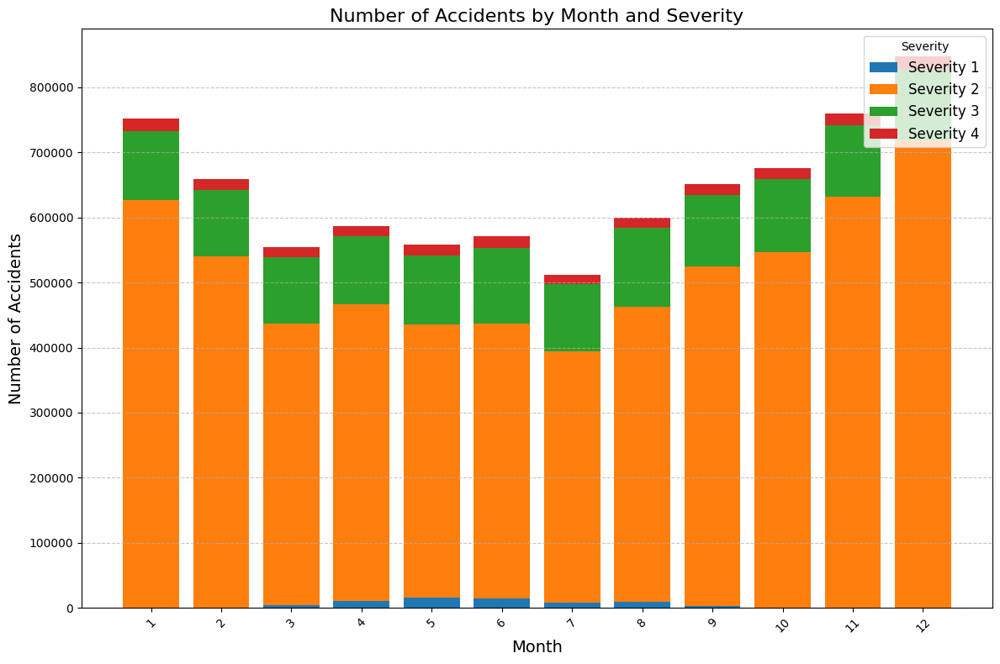

In [118]:
import matplotlib.pyplot as plt
import pandas as pd

# Assuming df_grouped is already created and sorted

# Step 1: Pivot the data to prepare for plotting
# Rows: Months (x-axis), Columns: Severity levels, Values: Count
df_pivot = df_grouped.pivot(index="Month", columns="Severity", values="Count").fillna(0)

# Step 2: Plot the stacked bar chart
plt.figure(figsize=(12, 8))
bottom = None

# Plot each severity level as a segment of the stacked bar
for severity in df_pivot.columns:
    if bottom is None:
        plt.bar(
            df_pivot.index, df_pivot[severity], label=f"Severity {severity}"
        )  # First layer
        bottom = df_pivot[severity]
    else:
        plt.bar(
            df_pivot.index,
            df_pivot[severity],
            bottom=bottom,
            label=f"Severity {severity}",
        )  # Subsequent layers
        bottom += df_pivot[severity]

# Step 3: Add labels, title, and legend
plt.title("Number of Accidents by Month and Severity", fontsize=16)
plt.xlabel("Month", fontsize=14)
plt.ylabel("Number of Accidents", fontsize=14)
plt.xticks(ticks=df_pivot.index, labels=df_pivot.index, rotation=45)
plt.legend(title="Severity", fontsize=12, loc="upper right")
plt.grid(axis="y", linestyle="--", alpha=0.7)

# Step 4: Show the plot
plt.tight_layout()
plt.show()

# Day Analysis

In [119]:
from pyspark.sql.functions import date_format

# Step 1: Extract the day of the week from Start_Time
df_with_day = df.withColumn("Day_of_Week", date_format("Start_Time", "EEEE"))

# Step 2: Group by the day of the week and count the number of accidents
df_grouped_by_day = df_with_day.groupBy("Day_of_Week").count()

# Step 3: Sort by day of the week in the correct order (Monday, Tuesday, ..., Sunday)
day_order = [
    "Monday",
    "Tuesday",
    "Wednesday",
    "Thursday",
    "Friday",
    "Saturday",
    "Sunday",
]
df_grouped_by_day = df_grouped_by_day.toPandas()
df_grouped_by_day["Day_of_Week"] = pd.Categorical(
    df_grouped_by_day["Day_of_Week"], categories=day_order, ordered=True
)
df_grouped_by_day = df_grouped_by_day.sort_values(by="Day_of_Week").reset_index(
    drop=True
)

# Step 4: Display the results
print(df_grouped_by_day)

  Day_of_Week    count
0      Monday  1210921
1     Tuesday  1290929
2   Wednesday  1312389
3    Thursday  1316229
4      Friday  1366499
5    Saturday   668683
6      Sunday   562744


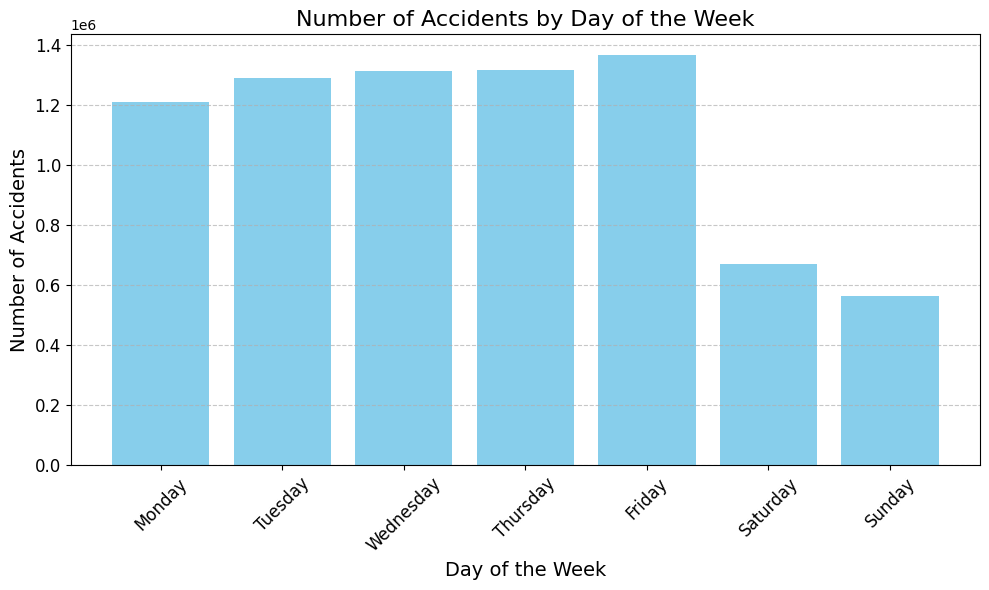

In [120]:
plt.figure(figsize=(10, 6))
plt.bar(df_grouped_by_day["Day_of_Week"], df_grouped_by_day["count"], color="skyblue")
plt.title("Number of Accidents by Day of the Week", fontsize=16)
plt.xlabel("Day of the Week", fontsize=14)
plt.ylabel("Number of Accidents", fontsize=14)
plt.xticks(rotation=45, fontsize=12)
plt.yticks(fontsize=12)
plt.grid(axis="y", linestyle="--", alpha=0.7)
plt.tight_layout()

# Show the plot
plt.show()

# Hour Analysis

In [123]:
from pyspark.sql.functions import hour
import matplotlib.pyplot as plt
import pandas as pd

# Step 1: Convert the dataframe to an RDD and extract the hour from Start_Time
rdd = df.select("Start_Time").rdd.map(lambda row: row["Start_Time"].hour)

# Step 2: Map each hour to a key-value pair and count occurrences using reduceByKey
rdd_grouped = rdd.map(lambda hour: (hour, 1)).reduceByKey(lambda a, b: a + b)

# Step 3: Collect the results and convert to Pandas DataFrame for plotting
data = rdd_grouped.collect()  # Collect the results as a list of tuples
df_grouped_by_hour = pd.DataFrame(
    data, columns=["Hour", "Count"]
)  # Convert to Pandas DataFrame

# Step 4: Sort the DataFrame by hour
df_grouped_by_hour = df_grouped_by_hour.sort_values(by="Hour").reset_index(drop=True)


<ipython-input-124-3fa53d005890>:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


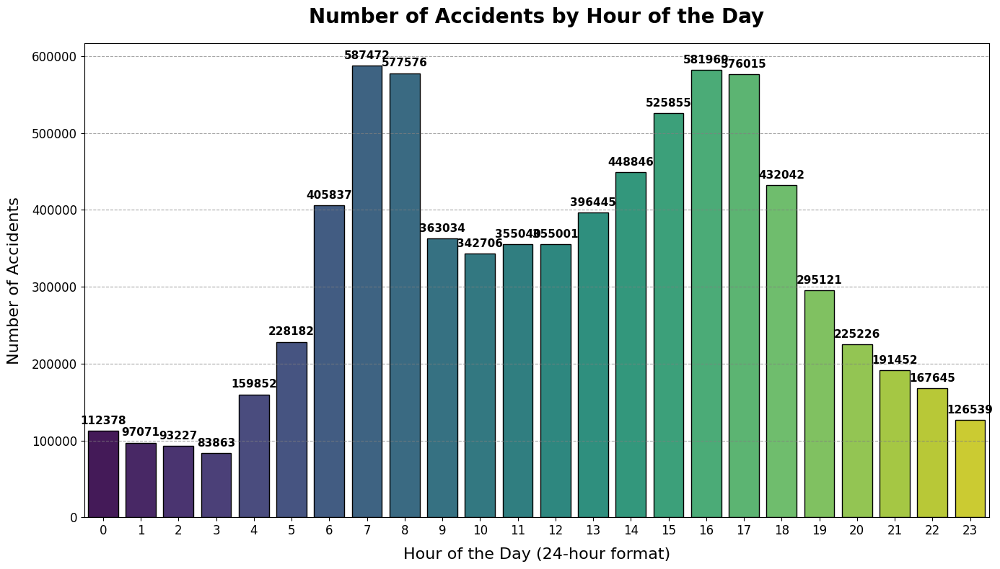

In [124]:
# Step 5: Plot the enhanced bar chart
plt.figure(figsize=(14, 8))
sns.barplot(
    x="Hour",
    y="Count",
    data=df_grouped_by_hour,
    palette="viridis",  # Use a visually appealing color palette
    edgecolor="black",
)

# Add titles and labels with custom styling
plt.title(
    "Number of Accidents by Hour of the Day", fontsize=20, fontweight="bold", pad=20
)
plt.xlabel("Hour of the Day (24-hour format)", fontsize=16, labelpad=10)
plt.ylabel("Number of Accidents", fontsize=16, labelpad=10)

# Format x-ticks and y-ticks
plt.xticks(ticks=range(0, 24), fontsize=12)
plt.yticks(fontsize=12)

# Add gridlines for better readability
plt.grid(axis="y", linestyle="--", color="gray", alpha=0.7)

# Annotate each bar with its value
for index, row in df_grouped_by_hour.iterrows():
    plt.text(
        x=row["Hour"],
        y=row["Count"]
        + max(df_grouped_by_hour["Count"]) * 0.01,  # Position slightly above the bar
        s=f"{int(row['Count'])}",  # Display the count value
        ha="center",
        va="bottom",
        fontsize=11,
        color="black",
        weight="bold",
    )

# Adjust layout for better fitting
plt.tight_layout()

# Show the plot
plt.show()